# [Bacterial Colony Growth](@id Bacteries)

In this example, we are going to create a bacterial model and grow a colony using it.

 - The implementation of the force interaction dynamics is the one presented by [Volfson et al. (2008)](https://www.pnas.org/doi/abs/10.1073/pnas.0706805105)
 - We use GPU accelerated dynamics

As described in other models, it is advised that the models are constructed by parts to avoid having to find bugs in a very complex system. Hence, we will split the model in two parts:

 - Forces model
 - Growth model

## Load the packages

In [244]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 1 threads 😎


In [245]:
# import Pkg
# Pkg.activate("../")
# Pkg.instantiate()


In [246]:
# import Pkg; Pkg.add(["Revise", "GLMakie"])

In [247]:
# using Revise
# using CellBasedModels
# using CUDA
# using Distributions
# using GLMakie
# # using GeometryBasics
# import GLMakie: Point3f, Cylinder, Sphere, NoShading #Can be changes to Cairo or CLMakie

In [248]:
import Pkg

# Activa el entorno del proyecto
Pkg.activate("../../../../")


# Resuelve y asegura dependencias
Pkg.resolve()
Pkg.instantiate()


# Carga los paquetes de forma ordenada
using Revise
using CellBasedModels
ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false  # (opcional, fuerza compilación local)
using CUDA
CUDA.set_runtime_version!(v"12.2")
using Distributions
using CairoMakie
using JSON

# Importa funciones específicas después
import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()


  Activating project at `~/Escritorio/Projects/Pushing/ABM_CBM`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Project.toml`
  No Changes to `~/Escritorio/Projects/Pushing/ABM_CBM/Manifest.toml`
┌ Info: Configure the active project to use CUDA 12.2; please re-start Julia for this to take effect.
└ @ CUDA /home/julia/.julia/packages/CUDA/jdJ7Z/lib/cudadrv/version.jl:82


## Forces model

We already use the defined forces model that is implemented in CBqodels. This is an exact copy of the rod model that you can find already predefined in `Models/rods.jl`. You can check the `Models` section of the documentation for more details.


In [249]:
rod2D = ABM(2,
    agent = Dict(
            :theta=>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :W=>Float64,
        ),    #Local Interaction Parameters

    model = Dict(
            :E=>Float64,
            :eta=>Float64,
        ),        #Global parameters

    agentODE = quote

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,d,l,theta,
                                    x[i2],y[i2],d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij

            
        end

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=GPU(),
    agentAlg = CBMIntegrators.Heun()
);


### Initialize a coqunity with two bacteries and check forces

In [250]:
com = Community(rod2D,
            N=30,
            dt=1.,
            simBox = [-10 10;-10 10.],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=100. *m/(t^2*d)*1.E-3 #kPa
com.eta=500 *m/(t*d) #Pa h

com.d = 1.        
com.l = 3.99      



com.x = 0
com.y = 0
com.theta = 0;


In [251]:
for i in 1:com.N
    com.theta[i] = rand() * 2π
    com.x[i] = rand()*16-8
    com.y[i] = rand()*16-8
    com.l[i] = 3.0
    com.d[i] = 1.0

end

In [252]:
evolve!(com,steps=10000,saveEach=100,preallocateAgents=com.N)

In [253]:
function plotAgents2D!(ax, x, y, d, l, angle, p; colormap=:inferno, kargs...)
    for (xi, yi, li, di, ai, pi) in zip(x, y, l, d, angle, p)



            colorval = pi
            # colormap = :inferno
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [colorval],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [colorval],
                colormap = colormap,
                kargs...
            )

    end
    return
end


plotAgents2D! (generic function with 1 method)

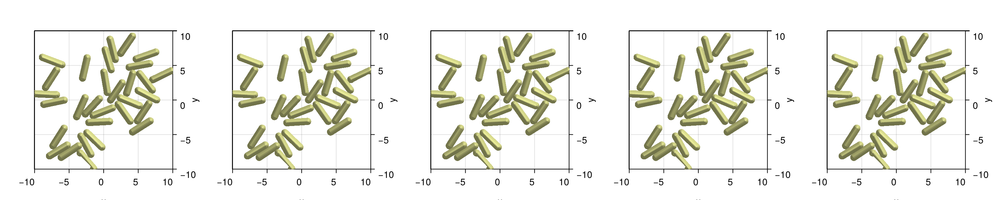

CairoMakie.Screen{IMAGE}


In [254]:
fig = Figure(size=(1500,300))

for (i,j) in enumerate([1:round(Int,length(com)/4):length(com);length(com)])
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    plotAgents2D!(
    ax,
    com[j][:x],
    com[j][:y],
    com[j][:d],
    com[j][:l],
    com[j][:theta],
    com[j][:l],
    colorrange = (0, maximum(com.l))
)

    xlims!(-10,10)
    ylims!(-10,10)
end

display(fig)

In [255]:

function log_community_state(parameters::OrderedDict, t::Int, path::String = "parameters_QS_cap.txt")
    # Convert keys to strings so JSON can serialize them
    string_keys = Dict(string(k) => v for (k, v) in parameters)
    # Build entry
    entry = Dict("t" => t, "parameters" => string_keys)
    # Save as a JSON line
    open(path, "a") do io
        println(io, JSON.json(entry))
    end
end


function load_parameters_log(path::String = "parameters_QS_cap.txt")
    log = Dict{Int, OrderedDict{Symbol, Any}}()
    for line in eachline(path)
        entry = JSON.parse(line)
        t = entry["t"]
        raw_params = entry["parameters"]
        params = OrderedDict(Symbol(k) => v for (k, v) in raw_params)
        log[t] = params
    end
    times = sort(collect(keys(log)))
    com_array = [log[t] for t in times]
    return com_array, times
end



load_parameters_log (generic function with 2 methods)

## Growth model

We construct over the forces model to add bacterial growth and cell division rules.

In [415]:
rods2dGrowth = ABM(2,
    baseModelInit = [rod2D],

    agent = Dict(
                :dg=> Float64, 
                :lTarget => Float64,
                :type => Int,
                :Ki => Float64,
                :V => Float64,
                :Gi => Float64,
                :Rg => Float64,
                :nk => Float64,
                :S => Float64
            ),

    model = Dict(
                :growth=>Float64,
                :σlTarget=>Float64,
                :lMax=>Float64,
                :D_q => Float64,
                :delta_q => Float64,
                :alpha_q => Float64, 
                :beta_q => Float64,
                :K_q=>Float64,
                :alpha_H => Float64, 
                :K_qH=>Float64,
                :q_c=>Float64,
                :F => Float64,
                :gk => Float64,
                :gL => Float64,
                :gv => Float64,
                :Vk0 => Float64,
                :VL => Float64,
                :Km => Float64,
                :alpha_Ke=> Float64,
                :Dp=> Float64,
                :alpha_n => Float64,
                :K_n => Float64,
                :delta_n => Float64,
                :gamma_H => Float64,
                :alpha_PGA => Float64,
                :alpha_P2 => Float64,
                :alpha_dg => Float64,
                :K_g => Float64,
                :alpha_g => Float64,
                :delta_g => Float64,
                :alpha_R => Float64,
                :delta_R => Float64,
                :beta_R => Float64,
                :K_R => Float64,
                :S0 => Float64,
                :K_S => Float64,
                :delta_s => Float64,
                :D_PGA => Float64,
                :D_H => Float64,
                :D_Ge => Float64,
                :D_Ke => Float64,
                :K_Ge => Float64,
                :Ki0 => Float64,
                :Gm => Float64,
            ),
    
    medium = Dict(
        :Ge => Float64,        #nutrient field
        :q => Float64,        #Qs field
        :Ke => Float64,        #External K+ field
        :H => Float64,        #Hydrogel field
        :P2 => Float64,        #PGA polymer field
        :PGA => Float64,        #PGA field
    ),

 
    agentODE = quote    
        Vk=Vk0*log(Ke/Ki)
        FV = 1/(1+exp(gv*(V-VL)))
        dt(l) = l*growth*Gi/(1+Gi) #linear growth with growth dependent on the pressure over the cell
        dt(Gi) = alpha_g*FV*Rg*Ge/(K_g+Ge)-delta_g*Gi #linear growth with growth dependent on the pressure over the cell
        dt(Rg) = alpha_R - delta_R*Rg + beta_R*Gi^2/(K_R^2+Gi^2) #linear growth with growth dependent on the pressure over the cell
        dt(Ki) = -F*gk*nk^4*(V-Vk)+Dp*Gi*Ke*(Ki0-Ki)
        dt(V) = -gk*nk^4*(V-Vk)-gL*(V-VL)
        dt(S) = S0 /(1 + (Gi/K_S)^2)-delta_s*S
        dt(nk) = alpha_n*S/(K_n + S)*(1-nk)-delta_n*nk 

        dg =  alpha_dg * H 

        fx = 0
        fy = 0
        W = 0
        @loopOverNeighbors i2 begin
            #Use the model provided in the documentation
            Fijx, Fijy, Wij = CBMModels.repulsiveForces_rods(x,y,dg+d,l,theta,
                                    x[i2],y[i2],dg[i2]+d[i2],l[i2],theta[i2],eta, E)

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            W += Wij

            
        end
        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(theta) =  W
    end,

    agentRule = quote #Bound cells
        Vk=Vk0*log(Ke/Ki)
        FV = 1/(1+exp(gv*(V-VL)))


        #Add division
        if l > lTarget
            ww = CBMDistributions.uniform(-1,1)*1.E-2 #To add some random torque at division time

            # ww = 0 #To add some random torque at division time
            #Add a new cell
            @addAgent(
                    x=(l+d)/4*cos(theta)+x,
                    y=(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    W=ww,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget),
                    dg=sqrt((l-d)^2+dg^2+4*dg*l)-(l-d))
            #Add a second cell
            @addAgent(
                    x=-(l+d)/4*cos(theta)+x,
                    y=-(l+d)/4*sin(theta)+y,
                    l=(l-d)/2,
                    lTarget = CBMDistributions.uniform(lMax-σlTarget,lMax+σlTarget), #New target length at which the bactery should divide
                    W=ww,
                    dg=sqrt((l-d)^2+dg^2+4*dg*l)-(l-d))
            #Remove the old cell
            @removeAgent()
        end
        # Probability of releasing qs with a saturating function
        
        q += (alpha_q + beta_q*q^4/(K_q^4 + q^4))*dt
        Ke += (F*gk*nk^4*(V-Vk)- Dp*Gi*Ke)*dt
        # PGA += (alpha_PGA*K_qH^4/(K_qH^4+(q-q_c)^4))*dt
        Ge += (-alpha_g*FV*Rg*Ge/(K_Ge+Ge))*dt
        

    end,

    #Medium dynamics with dirichlet conditions and a wall that is as oscillating source of material
    mediumODE=quote 
        if @mediumInside()
            dt(Ge) = D_Ge*(@∂2(1,Ge)+@∂2(2,Ge)) 
            dt(q) = D_q*(@∂2(1,q)+@∂2(2,q)) - delta_q*q 
            #dt(Ke) = D_k*(@∂2(1,Ke)+@∂2(2,Ke)) 
            dt(Ke) = D_Ke*(@∂2(1,Ke)+@∂2(2,Ke))
            # dt(PGA) = alpha_P2*PGA + D_PGA*(@∂2(1,q)+@∂2(2,q))
            # dt(P2) = -alpha_P2*PGA  + gamma_H*Ke*H 
        
            # dt(H) = +alpha_H*P2 - gamma_H*Ke*H + D_H*(@∂2(1,q)+@∂2(2,q))
            # dt(H) = +alpha_H*P2 - gamma_H*Ke*H

        elseif @mediumBorder(1,-1)
            q = 0
            Ke = Km
            PGA=0
            Ge = Gm
            H=0
            P2=0
        elseif @mediumBorder(1,1)
            q = 0 
            Ke = Km
            PGA=0
            Ge = Gm

            H=0
            P2=0
        elseif @mediumBorder(2,-1)
            q = 0
            Ke = Km
            PGA=0
            Ge = Gm

            H=0
            P2=0
        elseif @mediumBorder(2,1)
            q = 0
            Ke = Km
            PGA=0
            Ge = Gm

            H=0
            P2=0
        end

    end,

    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=4),
    platform=CPU(),
    agentAlg=CBMIntegrators.Heun(),
    mediumAlg=DifferentialEquations.Euler(),
);

In [416]:
function plotMixedAgents2D!(ax, x, y, d, l, angle, type, p; kargs...)
    for (xi, yi, li, di, ai, ti, pi) in zip(x, y, l, d, angle, type, p)


        if ti== 0  # rods
            # colorval = pi
            # colormap = :Blues
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:blue],
                # colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],

                color = [:blue],
                # colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [:blue],

                kargs...
            )
        else  # puntos
            colorval = pi
            colormap = :Reds
            meshscatter!(ax,
                [xi + li/2 * cos(ai)],
                [yi + li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:red],
                kargs...
            )
            meshscatter!(ax,
                [xi - li/2 * cos(ai)],
                [yi - li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = [:red],
                colormap = colormap,
                kargs...
            )
            meshscatter!(ax,
                [xi],
                [yi];
                marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
                markersize = [Point3f(li, di/2, di/2)],
                rotation = [ai],
                color = [:red],
                colormap = colormap,
                kargs...
            )
        end

    end
    return
end


plotMixedAgents2D! (generic function with 1 method)

## Grow colony from one cell

In [426]:
com = Community(rods2dGrowth,
            N=1,
            dt=0.0001,
            simBox = [-100 100;-100 100.],
            NMedium=[100,100],
            );

#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um


com.E=6* 1.E5 *m/(t^2*d) #Pa
com.eta=150 *m/(t^2*d) #Pa h

# com.D_q = 1.E-11 *d^2/t #m^2/s
com.D_q = 50 #m^2/s
com.D_Ge = 100 #m^2/s
# com.D_Ke = 0.0 #m^2/s

com.alpha_q = 2 #nM /h
com.delta_q = 0.1 #1/h
com.beta_q = 10 #1/s
com.K_q = 1


com.dg=0.
com.alpha_PGA = 10.
com.K_qH = 1.
com.q_c = 20. 

com.alpha_P2=0
com.alpha_H=0
com.gamma_H=0

com.growth = 1.
com.lMax = 4.     
com.σlTarget = 1. 
 
com.d = 1.        
com.l = 3.99      
com.lTarget = 4.  
# com.v = 2.E-2 



com.alpha_n = 91
com.K_n = 0.01
com.delta_n = 15


com.D_PGA =10
com.D_H = 1
com.D_Ke = 5

com.x = 0
com.y = 0
com.theta = 0

com.Km = 8
com.Ke = com.Km
com.Dp = 0.12 #mM⁻2 h⁻1
com.Gi = 10 #mM
com.F = 0.05 #mM/mV
com.gk =70 #h⁻1
com.gL =18 #h⁻1
com.Vk0 = 100 #mV
com.VL = -156 #mV
com.nk = 0. 
com.alpha_Ke = 10       
com.Ki = 300 #mM
com.V = -150 #mM

com.alpha_g = 24 #mM h⁻1
com.K_g = 0.75
com.delta_g = 4.8

com.alpha_R = 4.5
com.delta_R = 24.
com.beta_R = 31.
com.K_R = 2.25
com.S0 = 1.12
com.K_S = 1.
com.delta_s = 2.8
com.gv = 1.
com.K_Ge = 0.75
com.Ki0 = 300.


com.Gm = 100
com.Ge = com.Gm
com.S=0

0

In [427]:
steps=Int(round(8/com.dt))
# saveEach=steps/100
saveEach=Int(round(10/com.dt))/100
# steps=100000
# saveEach=10000
N=100 

loadToPlatform!(com,preallocateAgents=N)
open("parameters_QS_cap.txt", "w") do f
    # clear file at start
end

for step in 1:steps
    
    step!(com)
    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N <= 0
                println("Step ",step, " N: ", com.N, " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N  < 4*com.N
                N = 15*com.N
        end 
        println("Step ",step, " N: ", com.N)
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)


Step 1000 N: 2
Step 2000 N: 2
Step 3000 N: 2
Step 4000 N: 2
Step 5000 N: 2
Step 6000 N: 2
Step 7000 N: 2
Step 8000 N: 2
Step 9000 N: 2
Step 10000 N: 3
Step 11000 N: 3
Step 12000 N: 3
Step 13000 N: 3
Step 14000 N: 4
Step 15000 N: 4
Step 16000 N: 4
Step 17000 N: 4
Step 18000 N: 4
Step 19000 N: 4
Step 20000 N: 4
Step 21000 N: 4
Step 22000 N: 5
Step 23000 N: 7
Step 24000 N: 8
Step 25000 N: 8
Step 26000 N: 8
Step 27000 N: 8
Step 28000 N: 8
Step 29000 N: 8
Step 30000 N: 8
Step 31000 N: 9
Step 32000 N: 9
Step 33000 N: 10
Step 34000 N: 12
Step 35000 N: 13
Step 36000 N: 14
Step 37000 N: 16
Step 38000 N: 16
Step 39000 N: 16
Step 40000 N: 16
Step 41000 N: 17
Step 42000 N: 19
Step 43000 N: 19
Step 44000 N: 19
Step 45000 N: 23
Step 46000 N: 25
Step 47000 N: 28
Step 48000 N: 30
Step 49000 N: 32
Step 50000 N: 32
Step 51000 N: 32
Step 52000 N: 32
Step 53000 N: 32
Step 54000 N: 33
Step 55000 N: 39
Step 56000 N: 47
Step 57000 N: 53
Step 58000 N: 57
Step 59000 N: 61
Step 60000 N: 63
Step 61000 N: 64
Step

In [428]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")


(OrderedDict{Symbol, Any}[OrderedDict(:nk => Any[0.3053231534914822, 0.3053242544560514], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :Dp => Any[0.12], :K_S => Any[1.0], :VL => Any[-156.0], :y => Any[4.9818495379157086e-8, -4.981849566537544e-8], :growth => Any[1.0], :alpha_g => Any[24.0]…), OrderedDict(:nk => Any[0.5761701011564012, 0.5762036423720047], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :Dp => Any[0.12], :K_S => Any[1.0], :VL => Any[-156.0], :y => Any[1.4946591690324879e-7, -1.494659799336555e-7], :growth => Any[1.0], :alpha_g => Any[24.0]…), OrderedDict(:nk => Any[0.6561677662882974, 0.6561986198595291], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :Dp => Any[0.12], :K_S => Any[1.0], :VL => Any[-156.0], :y => Any[3.284968230182778e-7, -3.2849716578832954e-7], :growth => Any[1.0], :alpha_g => Any[24.0]…), OrderedDict(:nk => Any[0.6885204329816245, 0.6885445651045179], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :

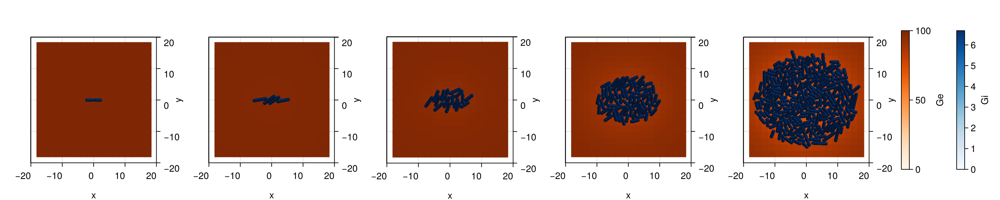

CairoMakie.Screen{IMAGE}


In [429]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")
colormap=:Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))
colormap_b=:Blues
colorrange_b = (0.0,  maximum(maximum(p -> maximum(p[:Gi]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]
simBox_cpu = Array(com.simBox)  # copia a CPU


for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:Gi],
    colorrange = colorrange_b,
    colormap = colormap_b,
    )

    xlims!(-20,20)
    ylims!(-20,20)
end

Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ge"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_b,
    colorrange = colorrange_b,
    label = "Gi"
)

display(fig)

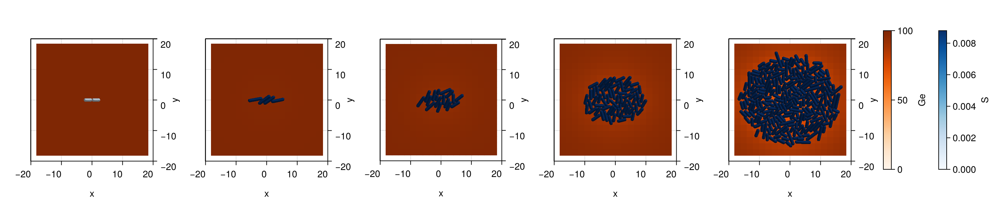

CairoMakie.Screen{IMAGE}


In [430]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")
colormap=:Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))
colormap_b=:Blues
colorrange_b = (0.0,  maximum(maximum(p -> maximum(p[:S]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]
simBox_cpu = Array(com.simBox)  # copia a CPU


for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:S],
    colorrange = colorrange_b,
    colormap = colormap_b,
    )

    xlims!(-20,20)
    ylims!(-20,20)
end

Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ge"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_b,
    colorrange = colorrange_b,
    label = "S"
)

display(fig)

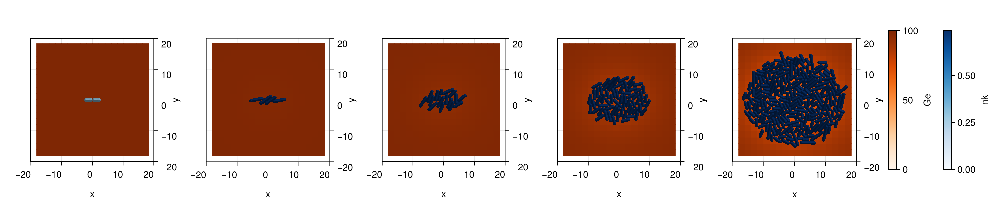

CairoMakie.Screen{IMAGE}


In [431]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")
colormap=:Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))
colormap_b=:Blues
colorrange_b = (0.0,  maximum(maximum(p -> maximum(p[:nk]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]
simBox_cpu = Array(com.simBox)  # copia a CPU


for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:nk],
    colorrange = colorrange_b,
    colormap = colormap_b,
    )

    xlims!(-20,20)
    ylims!(-20,20)
end

Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ge"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_b,
    colorrange = colorrange_b,
    label = "nk"
)

display(fig)

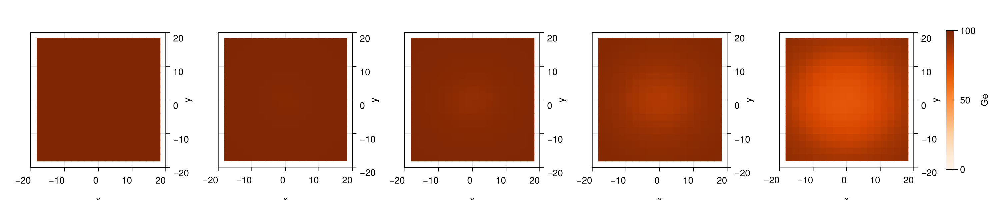

CairoMakie.Screen{IMAGE}


In [432]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")
colormap=:Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))
colormap_b=:Blues
colorrange_b = (0.0,  maximum(maximum(p -> maximum(p[:nk]), com_load)))
fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]
simBox_cpu = Array(com.simBox)  # copia a CPU


for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    


    xlims!(-20,20)
    ylims!(-20,20)
end

Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ge"
)


display(fig)

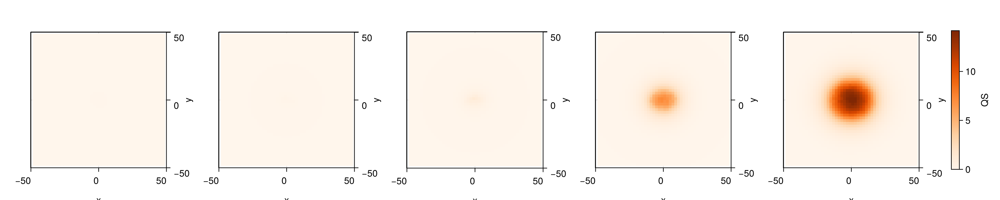

CairoMakie.Screen{IMAGE}


In [424]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")
colormap=:Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]
simBox_cpu = Array(com.simBox)  # copia a CPU


for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    


    xlims!(-50,50)
    ylims!(-50,50)
end

Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "QS"
)


display(fig)

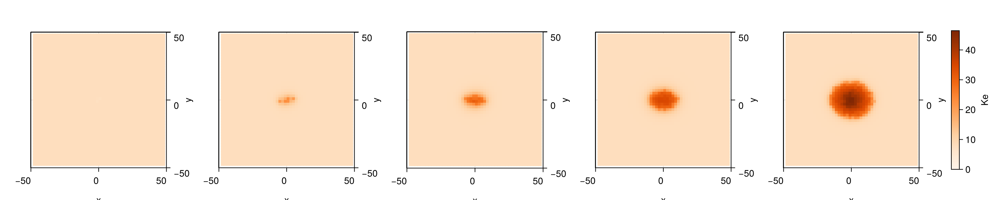

CairoMakie.Screen{IMAGE}


In [406]:
# Colormap común y colorrange fijo
colormap = :Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
# colorrange = (0.0,  0.01)


simBox_cpu = Array(com.simBox)  # copia a CPU

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:dg],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:dg],
    # colormap=:Blues,
    # colorrange = colorrange
    # )

    xlims!(-50,50)
    ylims!(-50,50)
end


# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)

display(fig)

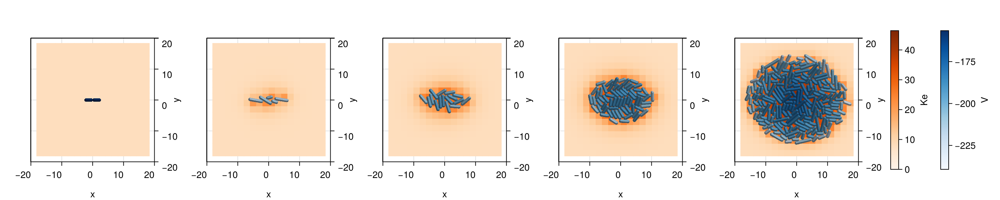

CairoMakie.Screen{IMAGE}


In [407]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:V],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "V"
    
)
display(fig)

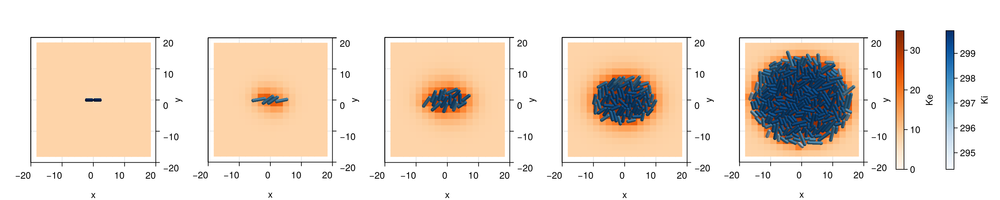

CairoMakie.Screen{IMAGE}


In [433]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:Ki]), com_load)),  maximum(maximum(p -> maximum(p[:Ki]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:Ki],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "Ki"
    
)
display(fig)

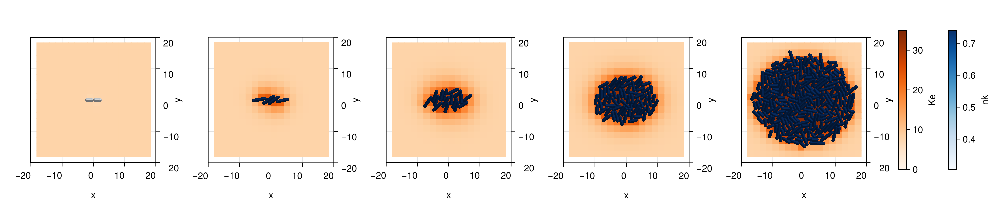

CairoMakie.Screen{IMAGE}


In [434]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:nk]), com_load)),  maximum(maximum(p -> maximum(p[:nk]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:nk],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "nk"
    
)
display(fig)

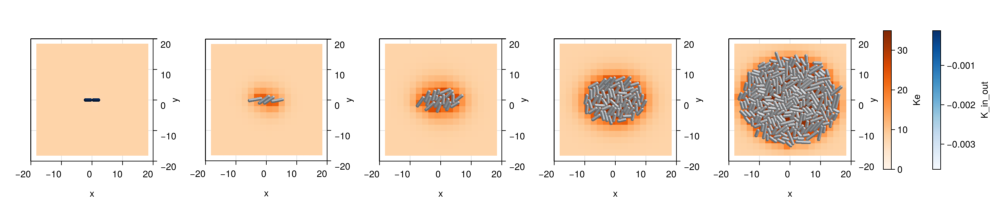

CairoMakie.Screen{IMAGE}


In [435]:

colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:F] .*p[:gk] .* p[:nk].^4 ./ (p[:V] .- p[:Vk0])), com_load)),  maximum(maximum(p -> maximum(p[:F] .*p[:gk] .* p[:nk].^4 ./ (p[:V] .- p[:Vk0])), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:F] .*com_load[j][:gk] .* com_load[j][:nk].^4 ./ (com_load[j][:V] .- com_load[j][:Vk0]),
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "K_in_out"
    
)
display(fig)

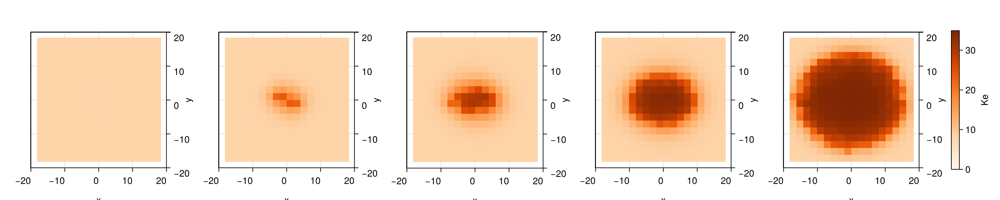

CairoMakie.Screen{IMAGE}


In [436]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    


    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)

display(fig)

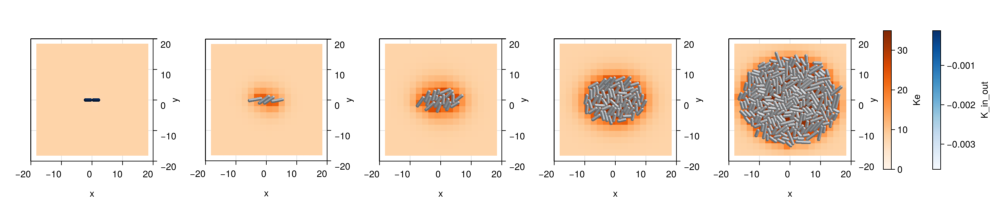

CairoMakie.Screen{IMAGE}


In [438]:

colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:F] .*p[:gk] .* p[:nk].^4 ./ (p[:V] .- p[:Vk0])), com_load)),  maximum(maximum(p -> maximum(p[:F] .*p[:gk] .* p[:nk].^4 ./ (p[:V] .- p[:Vk0])), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:F] .*com_load[j][:gk] .* com_load[j][:nk].^4 ./ (com_load[j][:V] .- com_load[j][:Vk0]),
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "K_in_out"
    
)
display(fig)

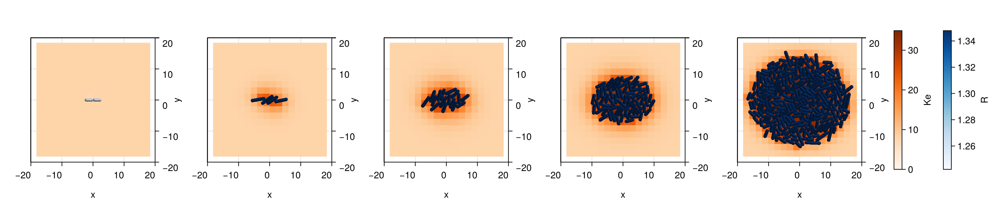

CairoMakie.Screen{IMAGE}


In [437]:

colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:Rg]), com_load)),  maximum(maximum(p -> maximum(p[:Rg]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:Rg],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-20,20)
    ylims!(-20,20)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "R"
    
)
display(fig)

In [271]:
bringFromPlatform!(com)

for (i, j) in enumerate(com.type)
    com.type[i]=i
end

In [272]:
com.type

32-element Vector{Int64}:
  1
  2
  3
  4
  5
  6
  7
  8
  9
 10
  ⋮
 24
 25
 26
 27
 28
 29
 30
 31
 32

In [273]:
# bringFromPlatform!(com)

# idmax=findfirst(x -> x == maximum(com.x), com.x)
# com.type[idmax] = 1 #Change the type of the first cell to 1, so it can be identified as the first cell

# idmax=findfirst(x -> x == maximum(com.y), com.y)
# com.type[idmax] = 2 #Change the type of the first cell to 1, so it can be identified as the first cell

# idmax=findfirst(x -> x == minimum(com.x), com.x)
# com.type[idmax] = 3 #Change the type of the first cell to 1, so it can be identified as the first cell

# idmax=findfirst(x -> x == minimum(com.y), com.y)
# com.type[idmax] = 4 #Change the type of the first cell to 1, so it can be identified as the first cell


In [372]:

prev_steps=steps
steps=Int(round(15/com.dt))

loadToPlatform!(com,preallocateAgents=N)


for step in 1+prev_steps:steps
    
    step!(com)

    if step % saveEach == 0
        bringFromPlatform!(com)
        if N - com.N[1] <= 0
                println("Step ",step, " N: ", com.N[1], " preallocateAgents: ", N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break
        elseif   N - com.N[1]  < 4*com.N[1]
                N = 15*com.N[1]
        end 
        println("Step ",step, " N: ", com.N[1])
        log_community_state(com.parameters, step)
        loadToPlatform!(com,preallocateAgents=N)
    end
end
bringFromPlatform!(com)


CompositeException: TaskFailedException

    nested task error: DomainError with -0.22000741396514112:
    log was called with a negative real argument but will only return a complex result if called with a complex argument. Try log(Complex(x)).
    DomainError detected in the user `f` function. This occurs when the domain of a function is violated.
    For example, `log(-1.0)` is undefined because `log` of a real number is defined to only output real
    numbers, but `log` of a negative number is complex valued and therefore Julia throws a DomainError
    by default. Cases to be aware of include:
    
    * `log(x)`, `sqrt(x)`, `cbrt(x)`, etc. where `x<0`
    * `x^y` for `x<0` floating point `y` (example: `(-1.0)^(1/2) == im`)
    
    Within the context of SciML, this error can occur within the solver process even if the domain constraint
    would not be violated in the solution due to adaptivity. For example, an ODE solver or optimization
    routine may check a step at `new_u` which violates the domain constraint, and if violated reject the
    step and use a smaller `dt`. However, the throwing of this error will have halted the solving process.
    
    Thus the recommended fix is to replace this function with the equivalent ones from NaNMath.jl
    (https://github.com/JuliaMath/NaNMath.jl) which returns a NaN instead of an error. The solver will then
    effectively use the NaN within the error control routines to reject the out of bounds step. Additionally,
    one could perform a domain transformation on the variables so that such an issue does not occur in the
    definition of `f`.
    
    For more information, check out the following FAQ page:
    https://docs.sciml.ai/Optimization/stable/API/FAQ/#The-Solver-Seems-to-Violate-Constraints-During-the-Optimization,-Causing-DomainErrors,-What-Can-I-Do-About-That?
    
    Stacktrace:
     [1] throw_complex_domainerror(f::Symbol, x::Float64)
       @ Base.Math ./math.jl:33
     [2] _log(x::Float64, base::Val{:ℯ}, func::Symbol)
       @ Base.Math ./special/log.jl:301
     [3] log
       @ ./special/log.jl:267 [inlined]
     [4] macro expansion
       @ ~/Escritorio/Projects/Pushing/ABM_CBM/proves/Membrane_potential/Depol/Depol_c/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X23sZmlsZQ==.jl:107 [inlined]
     [5] macro expansion
       @ ~/Escritorio/Projects/Pushing/ABM_CBM/src/AgentStructure/agentStructure.jl:135 [inlined]
     [6] macro expansion
       @ ~/Escritorio/Projects/Pushing/ABM_CBM/src/AgentStructure/auxiliar.jl:166 [inlined]
     [7] (::var"#1401#threadsfor_fun#1130"{var"#1401#threadsfor_fun#1127#1131"{Float64, Int64, Vector{Int64}, Int64, Vector{Float64}, Base.Threads.Atomic{Int64}, Matrix{Float64}, Float64, Float64, Base.Threads.Atomic{Int64}, Base.Threads.Atomic{Int64}, Vector{Int64}, Vector{Int64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Int64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Matrix{Float64}, Matrix{Float64}, Matrix{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, Vector{Float64}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 2, Array{Float64, 3}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 2, Array{Float64, 3}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 2, Array{Float64, 3}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, Vector{Float64}, Vector{Float64}, Vector{Float64}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, StepRange{Int64, Int64}}})(tid::Int64; onethread::Bool)
       @ Main ./threadingconstructs.jl:215
     [8] #1401#threadsfor_fun
       @ ./threadingconstructs.jl:182 [inlined]
     [9] (::Base.Threads.var"#1#2"{var"#1401#threadsfor_fun#1130"{var"#1401#threadsfor_fun#1127#1131"{Float64, Int64, Vector{Int64}, Int64, Vector{Float64}, Base.Threads.Atomic{Int64}, Matrix{Float64}, Float64, Float64, Base.Threads.Atomic{Int64}, Base.Threads.Atomic{Int64}, Vector{Int64}, Vector{Int64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Int64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Matrix{Float64}, Matrix{Float64}, Matrix{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, Vector{Float64}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, Vector{Float64}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 2, Array{Float64, 3}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 2, Array{Float64, 3}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 2, Array{Float64, 3}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}, Base.Slice{Base.OneTo{Int64}}}, true}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, Vector{Float64}, Vector{Float64}, Vector{Float64}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}, StepRange{Int64, Int64}}}, Int64})()
       @ Base.Threads ./threadingconstructs.jl:154

In [330]:
com_load,times=load_parameters_log("parameters_QS_cap.txt")



(OrderedDict{Symbol, Any}[OrderedDict(:nk => Any[0.0003282918084745708, 0.00032829180868817147], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :Dp => Any[0.12], :K_S => Any[0.02], :VL => Any[-156.0], :y => Any[-1.0077370861602769e-7, 1.007737086161184e-7], :growth => Any[1.0], :alpha_g => Any[24.0]…), OrderedDict(:nk => Any[0.0012552072543600469, 0.0012552072572558466], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :Dp => Any[0.12], :K_S => Any[0.02], :VL => Any[-156.0], :y => Any[-2.969682526749829e-7, 2.9696825267701316e-7], :growth => Any[1.0], :alpha_g => Any[24.0]…), OrderedDict(:nk => Any[0.0026940666661998598, 0.002694066675363124], :D_PGA => Any[10.0], :delta_q => Any[0.1], :Km => Any[8.0], :Dp => Any[0.12], :K_S => Any[0.02], :VL => Any[-156.0], :y => Any[-6.287916602692135e-7, 6.287916602808487e-7], :growth => Any[1.0], :alpha_g => Any[24.0]…), OrderedDict(:nk => Any[0.004522023001225352, 0.004522023018662384], :D_PGA => Any[10.0], :delta_q => Any[

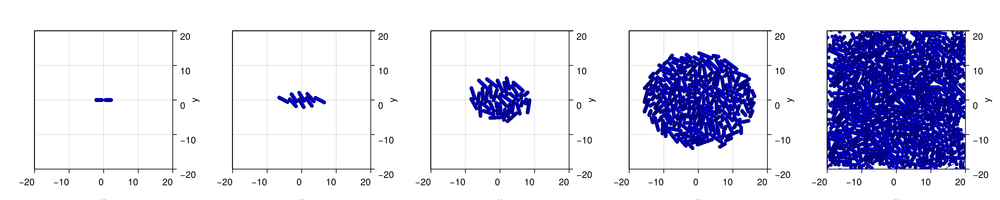

CairoMakie.Screen{IMAGE}


In [331]:
# Colormap común y colorrange fijo
# colormap = :viridis
# colorrange = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    # m = heatmap!(ax,
    #             range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
    #             range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
    #             Float64.(hcat(com_load[j][:q]...)),
    #             colormap = colormap,
    #             colorrange = colorrange
    #         )
    

    plotMixedAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:V],
    colorrange = (0, 0.03)
    )

    xlims!(-20,20)
    ylims!(-20,20)
end

# Añadir colorbar común al final
# Colorbar(fig[1, length(js) + 1],
#     colormap = colormap,
#     colorrange = colorrange,
#     label = "QS"
# )

display(fig)

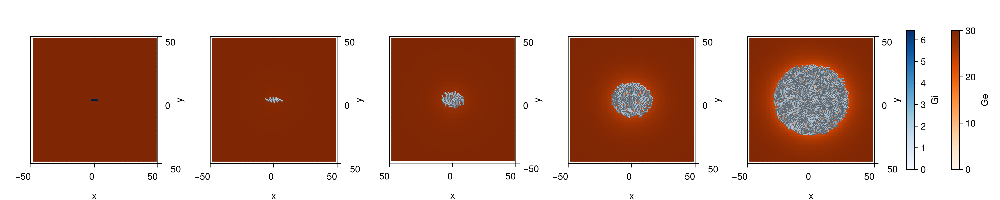

CairoMakie.Screen{IMAGE}


In [332]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Gi]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg].+com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:Gi],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Gi"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ge"
)

display(fig)

In [345]:
com_load[:gv]

ArgumentError: ArgumentError: invalid index: :gv of type Symbol

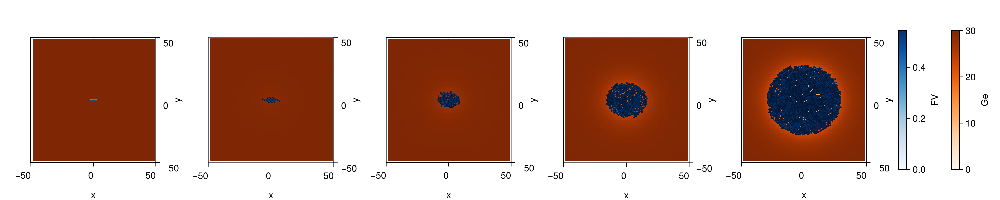

CairoMakie.Screen{IMAGE}


In [354]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(1 ./(1 .+ exp.(p[:gv].*(p[:V].-p[:VL])))), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg].+com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    1 ./(1 .+exp.(com_load[j][:gv].*(com_load[j][:V].-com_load[j][:VL]))),
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "FV"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ge"
)

display(fig)

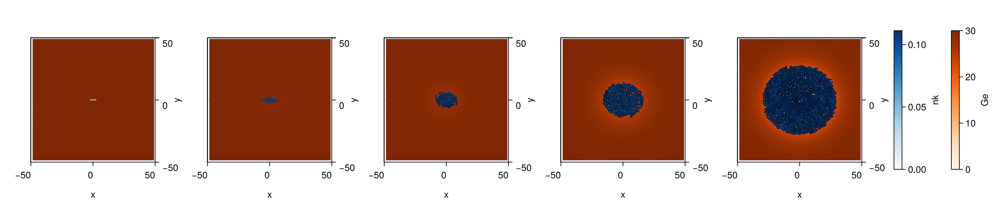

CairoMakie.Screen{IMAGE}


In [333]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:nk]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg].+com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:nk],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "nk"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ge"
)

display(fig)

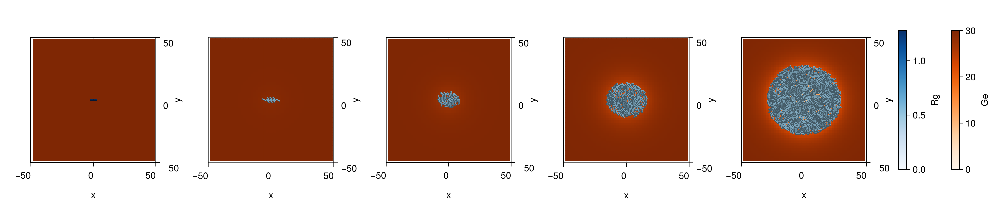

CairoMakie.Screen{IMAGE}


In [334]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:Rg]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ge]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg].+com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:Rg],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Rg"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ge"
)

display(fig)

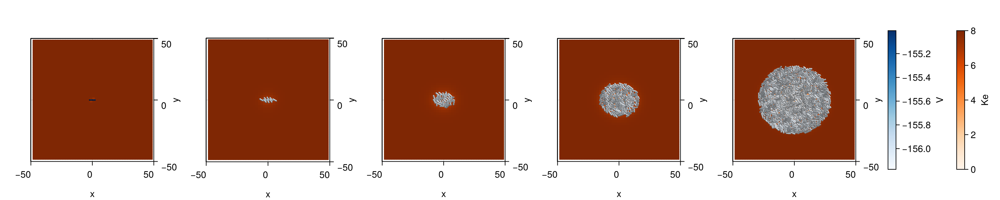

CairoMakie.Screen{IMAGE}


In [335]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg].+com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:V],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "V"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ke"
)

display(fig)

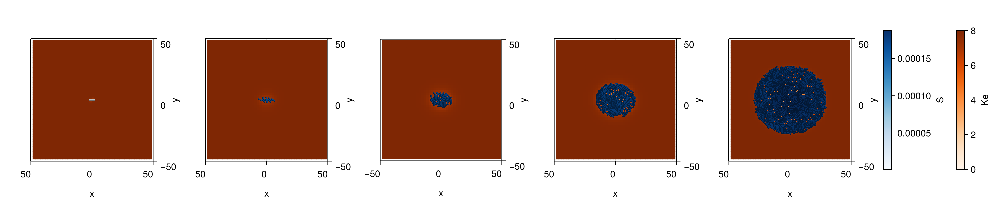

CairoMakie.Screen{IMAGE}


In [336]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (minimum(minimum(p -> minimum(p[:S]), com_load)),  maximum(maximum(p -> maximum(p[:S]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg].+com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:S],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "S"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ke"
)

display(fig)

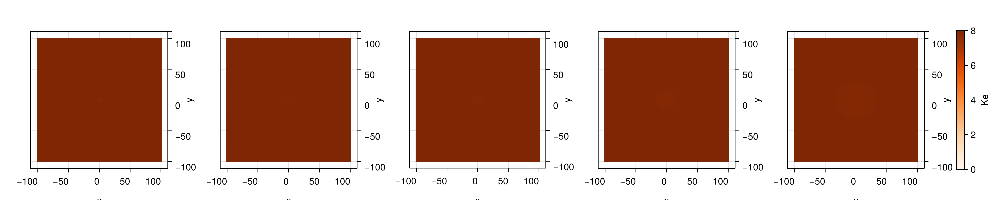

CairoMakie.Screen{IMAGE}


In [294]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:dg].+com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:V],
    # colormap=:Blues,
    # colorrange = colorrange
    # )

    # xlims!(-50,50)
    # ylims!(-50,50)
end

# Añadir colorbar común al final

Colorbar(fig[1, length(js) + 1],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "Ke"
)

display(fig)

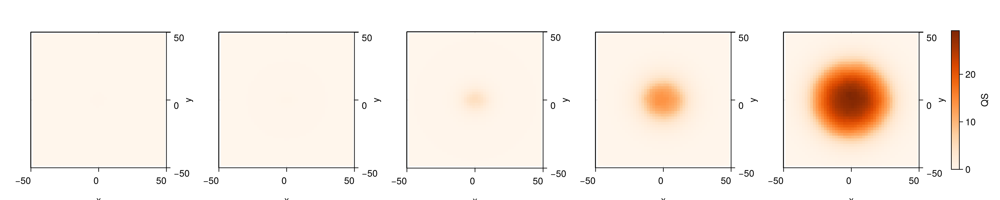

CairoMakie.Screen{IMAGE}


In [167]:

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    



    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "QS"
)

display(fig)

In [171]:
function plotMixedAgents!(ax, x, y, d, l, angle, type, p; kargs...)
    
    # Diccionario de tipos a colormaps (puedes extenderlo con más tipos y colores)
    colormap_dict = Dict(
        0 => :Blues,
        1 => :Reds,
        2 => :Greens,   
        3 => :Oranges,
        4 => :Purples,
        5 => :Greys
    )

    for (xi, yi, li, di, ai, ti, pi) in zip(x, y, l, d, angle, type, p)
        # Colormap según tipo, o uno genérico si no está definido
        colormap = get(colormap_dict, ti, :viridis)

        # Color numérico según p
        colorval = pi

        # Esferas en los extremos
        for dx in (-1, 1)
            meshscatter!(ax,
                [xi + dx * li/2 * cos(ai)],
                [yi + dx * li/2 * sin(ai)];
                marker = Sphere(Point3f(0, 0, 0), Float32(1)),
                markersize = [Point3f(di/2, di/2, di/2)],
                color = colorval,
                colormap = colormap,
                kargs...
            )
        end

        # Cuerpo alargado
        meshscatter!(ax,
            [xi],
            [yi];
            marker = Cylinder(Point3f(-.5, 0, 0), Point3f(.5, 0, 0), Float32(1)),
            markersize = [Point3f(li, di/2, di/2)],
            rotation = [ai],
            color = colorval,
            colormap = colormap,
            kargs...
        )
    end
    return
end


plotMixedAgents! (generic function with 1 method)

In [172]:
minimum(p -> minimum(
    Float64.(p[:F]) .* Float64.(p[:gk]) .* Float64.(p[:nk]).^4 ./
    (Float64.(p[:V]) .- Float64.(p[:Vk0]) .* log.(8 ./ Float64.(p[:Ki])))
), com_load)

3.809697309201293e-12

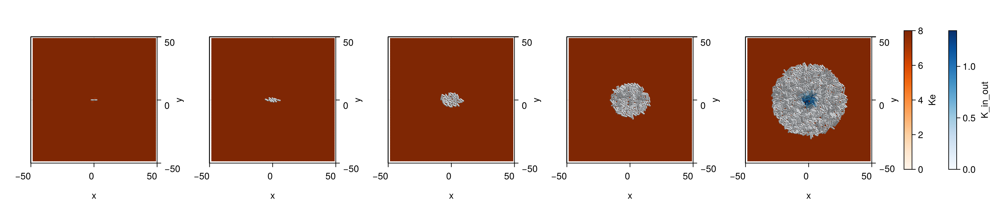

CairoMakie.Screen{IMAGE}


In [173]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (0,  maximum(p -> maximum(
    Float64.(p[:F]) .* Float64.(p[:gk]) .* Float64.(p[:nk]).^4 ./
    (Float64.(p[:V]) .- Float64.(p[:Vk0]) .* log.(8 ./ Float64.(p[:Ki])))
), com_load)
)


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:F] .*com_load[j][:gk] .* com_load[j][:nk].^4 ./ (com_load[j][:V] .- com_load[j][:Vk0] .* log.(8 ./ com_load[j][:Ki])),
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "K_in_out"
    
)
display(fig)

In [174]:
# Colormap común y colorrange fijo
# colormap = :viridis
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    # m = heatmap!(ax,
    #             range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
    #             range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
    #             Float64.(hcat(com_load[j][:q]...)),
    #             colormap = colormap,
    #             colorrange = colorrange
    #         )
    

    plotMixedAgents!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:generation],
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
# Colorbar(fig[1, length(js) + 1],
#     colormap = colormap,
#     colorrange = colorrange,
#     label = "QS"
# )

display(fig)

KeyError: KeyError: key :generation not found

In [175]:
length(com_load[end][:x])

793

In [176]:
# Colormap común y colorrange fijo
colormap = :Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))
# colorrange = (0.0,  0.01)



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotMixedAgents!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:generation],
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "QS"
)

display(fig)

KeyError: KeyError: key :generation not found

In [177]:
# Colormap común y colorrange fijo
colormap = :Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))
# colorrange = (0.0,  0.01)



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotMixedAgents!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:type],
    com_load[j][:generation],
    colorrange = colorrange
    )

    xlims!(-100,100)
    ylims!(-100,100)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "QS"
)

display(fig)

KeyError: KeyError: key :generation not found

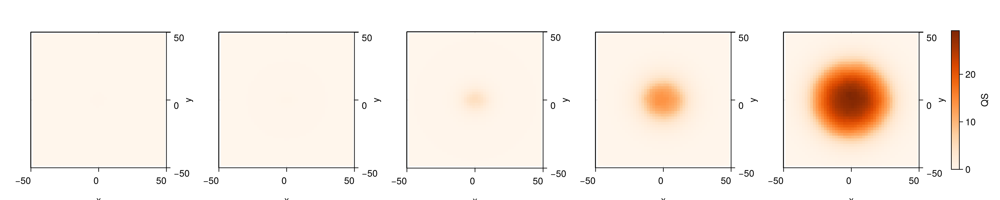

CairoMakie.Screen{IMAGE}


In [178]:
# Colormap común y colorrange fijo
colormap = :Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))
# colorrange = (0.0,  0.01)



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    # plotMixedAgents!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:type],
    # com_load[j][:generation],
    # colorrange = colorrange
    # )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "QS"
)

display(fig)

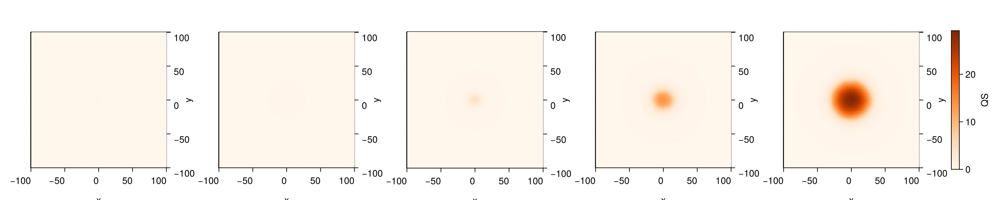

CairoMakie.Screen{IMAGE}


In [179]:
# Colormap común y colorrange fijo
colormap = :Oranges
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))
# colorrange = (0.0,  0.01)



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    # plotMixedAgents!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:type],
    # com_load[j][:generation],
    # colorrange = colorrange
    # )

    xlims!(-100,100)
    ylims!(-100,100)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "QS"
)

display(fig)

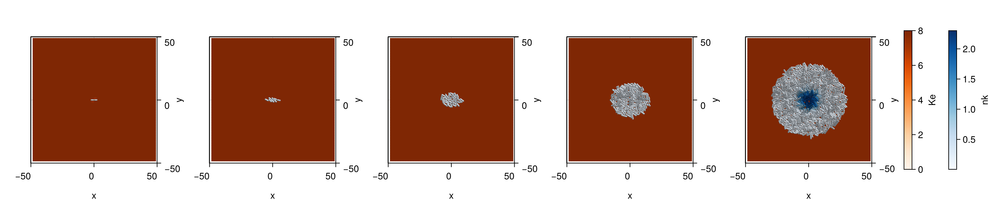

CairoMakie.Screen{IMAGE}


In [180]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:nk]), com_load)),  maximum(maximum(p -> maximum(p[:nk]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:nk],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "nk"
    
)
display(fig)

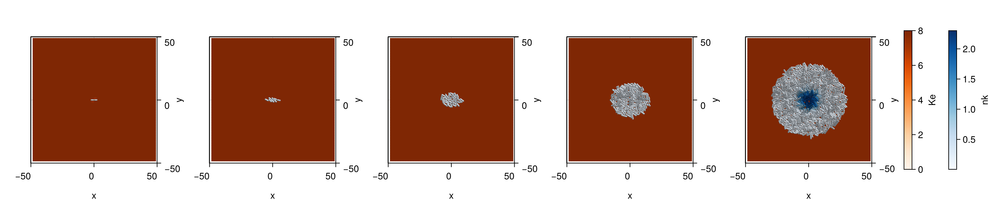

CairoMakie.Screen{IMAGE}


In [181]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:nk]), com_load)),  maximum(maximum(p -> maximum(p[:nk]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:nk],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "nk"
    
)
display(fig)

In [182]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:pressure]), com_load)),  maximum(maximum(p -> maximum(p[:pressure]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:pressure],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "P"
    
)
display(fig)

KeyError: KeyError: key :pressure not found

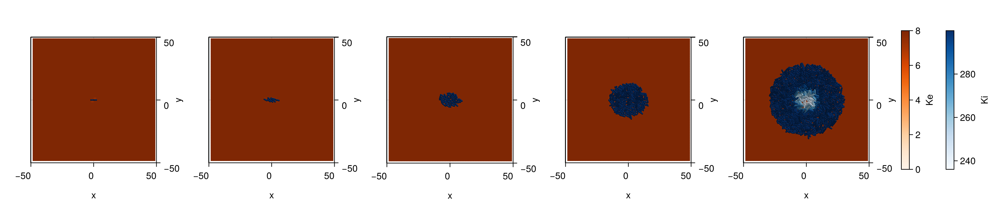

CairoMakie.Screen{IMAGE}


In [183]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:Ki]), com_load)),  maximum(maximum(p -> maximum(p[:Ki]), com_load)))


fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:Ki],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "Ki"
    
)
display(fig)

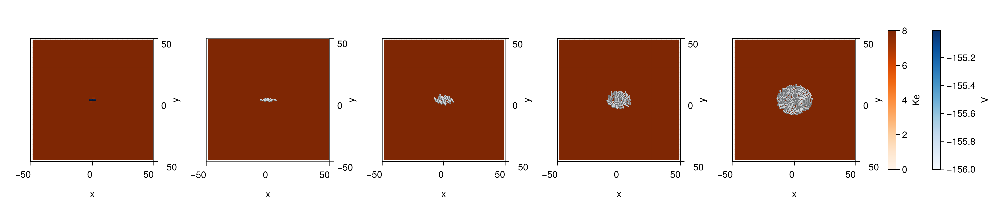

CairoMakie.Screen{IMAGE}


In [241]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:V],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "V"
    
)
display(fig)

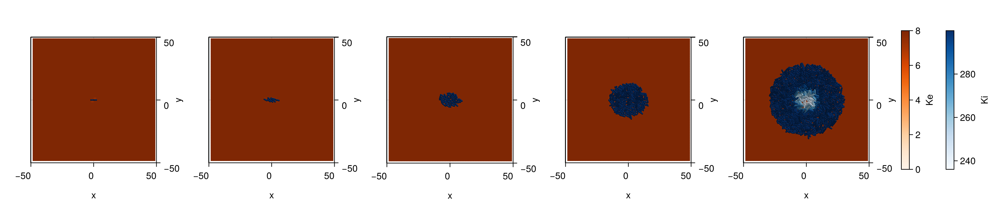

CairoMakie.Screen{IMAGE}


In [209]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:Ki]), com_load)),  maximum(maximum(p -> maximum(p[:Ki]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    # com_load[j][:type],
    com_load[j][:Ki],
    colorrange = colorrange_h,
    colormap=:Blues
    )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)
Colorbar(fig[1, length(js) + 2],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "Ki"
    
)
display(fig)

In [185]:
maximum(maximum(p -> maximum(p[:Ke]), com_load))

8.0

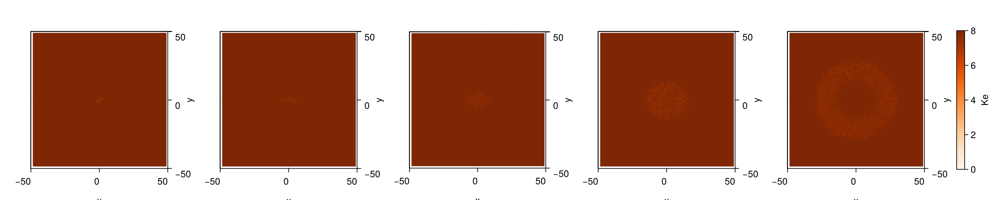

CairoMakie.Screen{IMAGE}


In [186]:
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ke]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:Ke]...)),
                colormap = colormap,
                colorrange = colorrange
            )
    



    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ke"
)

display(fig)

In [187]:
function plot_evolution_by_type_from_positions(com)
    colormap_dict = Dict(
        0 => :Blues,
        1 => :Reds,
        2 => :Greens,
        3 => :Oranges,
        4 => :Purples,
        5 => :Greys
    )

    tipos = unique(com[end][:type])
    tipos = sort(tipos)[2:end]

    first_gen = Dict{Int, NamedTuple}()

    for t in sort(collect(keys(com)))
        for (i, ti) in enumerate(com[t][:type])
            if !(ti in keys(first_gen))
                first_gen[ti] = (
                    tiempo = t,
                    index = i,
                    x0 = com[t][:x][i],
                    y0 = com[t][:y][i]
                )
            end
        end
    end

    fig = Figure()
    ax = Axis(fig[1, 1], 
            xlabel = "θ",
            ylabel = "r",
            yreversed = true,
            )

    for t in sort(collect(keys(com)))
        com_t = com[t]

        for ti in tipos
            indices = findall(com_t[:type] .== ti)
            if isempty(indices)
                continue
            end

            f = first_gen[ti]
            x0, y0 = f.x0, f.y0
            gen0 = f.tiempo

            xs = com_t[:x][indices]
            ys = com_t[:y][indices]
            gens = fill(t - gen0, length(indices))

            distances = sqrt.((xs).^2 .+ (ys).^2)

            # Ángulo relativo calculado por desplazamiento
            angles = atan.(ys, xs)  



            colormap = haskey(colormap_dict, ti) ? colormap_dict[ti] : error("Tipo $ti no tiene colormap definido")

            scatter!(ax, angles, distances;
                color = gens,
                colormap = colormap,
                markersize = 10,
                label = "Tipo $ti",
                colorrange = (0, length(com)),
            )
        end
    end

    # axislegend(ax)
    return fig
end


plot_evolution_by_type_from_positions (generic function with 1 method)

In [188]:
function plot_evolution(com)
    colormap_dict = Dict(
        0 => :Blues,
        1 => :Reds,
        2 => :Greens,
        3 => :Oranges,
        4 => :Purples,
        5 => :Greys
    )

    tipos = unique(com[end][:type])
    tipos = sort(tipos)[2:end]

    first_gen = Dict{Int, NamedTuple}()

    for t in sort(collect(keys(com)))
        for (i, ti) in enumerate(com[t][:type])
            if !(ti in keys(first_gen))
                first_gen[ti] = (
                    tiempo = t,
                    index = i,
                    x0 = com[t][:x][i],
                    y0 = com[t][:y][i]
                )
            end
        end
    end

    fig = Figure(backgroundcolor = :black)  # Fondo negro

    ax = Axis(
        fig[1, 1],
        xlabel = "θ",  # Letra griega
        ylabel = "r",
        yreversed = true,
        backgroundcolor = :black,
        xlabelcolor = :white,
        ylabelcolor = :white,
        xticklabelcolor = :white,
        yticklabelcolor = :white,
        xtickcolor = :white,
        ytickcolor = :white,
        bottomspinecolor = :white,
        leftspinecolor = :white,
        rightspinecolor = :white,
        topspinecolor = :white
    )

    for t in sort(collect(keys(com)))
        com_t = com[t]

        for ti in tipos
            indices = findall(com_t[:type] .== ti)
            if isempty(indices)
                continue
            end

            f = first_gen[ti]
            x0, y0 = f.x0, f.y0
            gen0 = f.tiempo

            xs = com_t[:x][indices]
            ys = com_t[:y][indices]
            gens = fill(t - gen0, length(indices))

            distances = sqrt.((xs).^2 .+ (ys).^2)
            angles = atan.(ys, xs)

            colormap = get(colormap_dict, ti, :viridis)

            scatter!(ax, angles, distances;
                color = gens,
                colormap = colormap,
                markersize = 10,
                label = "Tipo $ti",
                colorrange = (0, length(com)),
            )
        end
    end

    return fig
end


plot_evolution (generic function with 1 method)

In [189]:
plot_evolution_by_type_from_positions(com_load)


ErrorException: Tipo 6 no tiene colormap definido

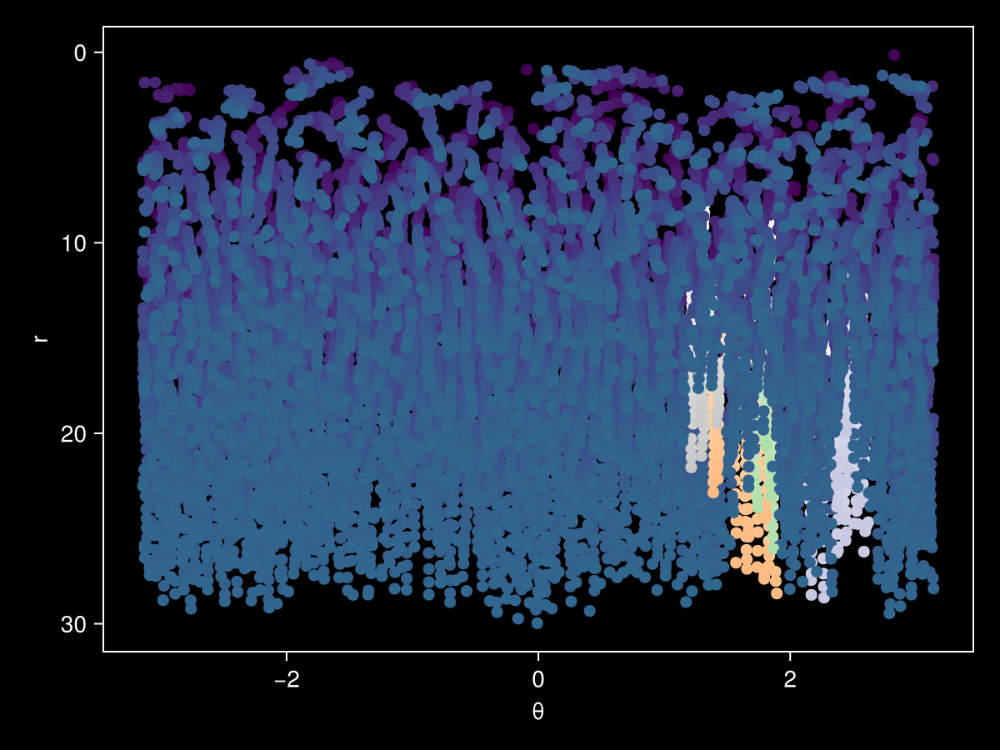

In [190]:
plot_evolution(com_load)


In [191]:

# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())


colorrange = (0.0,  maximum(maximum(p -> maximum(p[:generation]), com_load)))

Makie.record(fig, "core_linage_2.mp4", 1:length(com_load); framerate = 15) do j
 
    Makie.empty!(ax)
   
    plotMixedAgents!(
        ax,
        com_load[j][:x],
        com_load[j][:y],
        com_load[j][:d],
        com_load[j][:l],
        com_load[j][:theta],
        com_load[j][:type],
        com_load[j][:generation],
        colorrange = colorrange
    )


    xlims!(ax, -50, 50)
    ylims!(ax, -50, 50)
end


KeyError: KeyError: key :generation not found

In [192]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))



fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    # m = heatmap!(ax,
    #             range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
    #             range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
    #             Float64.(hcat(com_load[j][:q]...)),
    #             colormap = colormap,
    #             colorrange = colorrange
    #         )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:dg],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-100,100)
    ylims!(-100,100)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "H"
)

display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [193]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:dg],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:dg],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-100,100)
    ylims!(-100,100)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "H"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "QS"
)

display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [194]:
[1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

5-element Vector{Int64}:
   1
  31
  61
  91
 120

In [195]:
# Colormap común y colorrange fijo
colormap = :Blues
colorrange = (0.0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))

# Colormap común y colorrange fijo
colormap_q = :Oranges
colorrange_q = (0.0,  maximum(maximum(p -> maximum(p[:q]), com_load)))

fig = Figure(size=(1500,300))

js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )
    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )
    

    plotAgents2D!(
    ax,
    com_load[j][:x],
    com_load[j][:y],
    com_load[j][:d],
    com_load[j][:l],
    com_load[j][:theta],
    com_load[j][:dg],
    colormap=:Blues,
    colorrange = colorrange
    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = colormap,
    colorrange = colorrange,
    label = "H"
)
Colorbar(fig[1, length(js) + 2],
    colormap = colormap_q,
    colorrange = colorrange_q,
    label = "QS"
)

display(fig)

ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [196]:
[1:round(Int, length(com_load[80:140])/2):length(com_load[80:140]); length(com_load[80:140])][1:end-1]

BoundsError: BoundsError: attempt to access 120-element Vector{OrderedDict{Symbol, Any}} at index [80:140]

In [197]:


# Configuración general
colormap = Reverse(:Blues)
colorrange = (minimum(minimum(p -> minimum(p[:V]), com_load[1:140])),  maximum(maximum(p -> maximum(p[:V]), com_load[80:140])))

colormap_q = :Oranges
colorrange_q = (0,  maximum(maximum(p -> maximum(p[:q]), com_load[80:140])))

fig = Figure(size=(900,300))

js = [1:round(Int, length(com_load[80:140])/2):length(com_load[80:140]); length(com_load[80:140])][1:end-1]

for (i,j) in enumerate(js)
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                ylabelvisible=false,
                xlabelvisible=false,
                zticklabelsvisible=false,
                xticklabelsvisible=false,
                yticklabelsvisible=false,
                zgridvisible=false,
                ygridvisible=false,
                xgridvisible=false,
                zspinesvisible=false,
            )

    hidedecorations!(ax) # quita ticks, etiquetas y títulos

    m = heatmap!(ax,
            range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
            range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
            Float64.(hcat(com_load[80:140][j][:q]...)),
            colormap = colormap_q,
            colorrange = colorrange_q
        )


    plotAgents2D!(
    ax,
    com_load[80:140][j][:x],
    com_load[80:140][j][:y],
    com_load[80:140][j][:d],
    com_load[80:140][j][:l],
    com_load[80:140][j][:theta],
    com_load[80:140][j][:V],
    colorrange = colorrange,
    colormap = Reverse(:Greens)

    )

    xlims!(-50,50)
    ylims!(-50,50)
end

# Añadir colorbar común al final
Colorbar(fig[1, length(js) + 1],
    colormap = :Oranges,
    colorrange = colorrange_q,
    label = "QS",
    ticklabelsvisible = false,
    ticksvisible=false,
)
Colorbar(fig[1, length(js) + 2],
    colormap = Reverse(:Greens),
    colorrange = colorrange,
    label = "V",
    ticklabelsvisible = false,
    ticksvisible=false,

)
save("Core_QS_V.png", fig)
save("Core_QS_V.svg", fig)

display(fig)

BoundsError: BoundsError: attempt to access 120-element Vector{OrderedDict{Symbol, Any}} at index [1:140]

In [198]:
# # Colormap común y colorrange fijo
# colormap = :Blues
# colorrange = (0.8,  maximum(maximum(p -> maximum(p[:dg]), com_load)))



# fig = Figure(size=(1500,300))

# js = [1:round(Int, length(com_load)/4):length(com_load); length(com_load)]

# for (i,j) in enumerate(js)
#     ax = Axis3(fig[1,i],
#                 azimuth=3*π/2,
#                 elevation=π/2,
#                 zlabelvisible=false,
#                 zticklabelsvisible=false,
#                 zgridvisible=false,
#                 zspinesvisible=false
#             )
#     # m = heatmap!(ax,
#     #             range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
#     #             range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
#     #             Float64.(hcat(com_load[j][:q]...)),
#     #             colormap = colormap,
#     #             colorrange = colorrange
#     #         )
    

#     plotAgents2D!(
#     ax,
#     com_load[j][:x],
#     com_load[j][:y],
#     com_load[j][:d],
#     com_load[j][:l],
#     com_load[j][:theta],
#     com_load[j][:dg],
#     colormap=:Blues,
#     colorrange = colorrange,
#     )

#     xlims!(-50,50)
#     ylims!(-50,50)
# end

# # Añadir colorbar común al final
# Colorbar(fig[1, length(js) + 1],
#     colormap = colormap,
#     colorrange = colorrange,
#     label = "dH"
# )

# display(fig)

In [199]:

# Configuración general
colormap = :Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:q]), com_load)))


# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
Colorbar(grid[1, 2], colormap=colormap, colorrange=colorrange, label="QS")  # una vez



n_repeats = 1  # Número de veces que repetimos cada frame
framerate = 1  # 10 fps → cada frame se mantiene 1 segundo

Makie.record(fig, "dep_QS.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
    j = ceil(Int, i / n_repeats)  # Frame real 

    if i % n_repeats == 0
        Makie.empty!(ax)
        # Preparar heatmap observable para actualizar luego
        x = range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.q)[1])
        y = range(simBox_cpu[2,1], simBox_cpu[2,2], length=size(com.q)[2])
        z = copy(hcat(com_load[j][:q]...))  # inicializa con primer frame

        hm = heatmap!(ax, x, y, z; colormap=colormap, colorrange=colorrange)
    end
    # Makie.empty!(ax)
    # # Preparar heatmap observable para actualizar luego
    # x = range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.q)[1])
    # y = range(simBox_cpu[2,1], simBox_cpu[2,2], length=size(com.q)[2])
    # z = copy(hcat(com_load[j][:q]...))  # inicializa con primer frame

    # hm = heatmap!(ax, x, y, z; colormap=colormap, colorrange=colorrange)

    # plotMixedAgents2D!(
    #     ax,
    #     com_load[j][:x],
    #     com_load[j][:y],
    #     com_load[j][:d],
    #     com_load[j][:l],
    #     com_load[j][:theta],
    #     com_load[j][:type],
    #     com_load[j][:pressure],
    #     colorrange = (0, 0.03)
    # )


    xlims!(ax, -50, 50)
    ylims!(ax, -50, 50)
end


"dep_QS.mp4"

In [200]:

# Configuración general
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:Ge]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))


# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
Colorbar(fig[1, 2],
    colormap = colormap,
    colorrange = colorrange,
    label = "Ge"
)
Colorbar(fig[1, 3],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "V"
    
)


n_repeats = 1  # Número de veces que repetimos cada frame
framerate = 10  # 10 fps → cada frame se mantiene 1 segundo

Makie.record(fig, "dep_Ge_V.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
    j = ceil(Int, i / n_repeats)  # Frame real 

    if i % n_repeats == 0
        Makie.empty!(ax)
        # Preparar heatmap observable para actualizar luego
        x = range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.q)[1])
        y = range(simBox_cpu[2,1], simBox_cpu[2,2], length=size(com.q)[2])
        z = copy(hcat(com_load[j][:PGA]...))  # inicializa con primer frame

        hm = heatmap!(ax, x, y, z; colormap=colormap, colorrange=colorrange)

        plotAgents2D!(
            ax,
            com_load[j][:x],
            com_load[j][:y],
            com_load[j][:d],
            com_load[j][:l],
            com_load[j][:theta],
            # com_load[j][:type],
            com_load[j][:V],
            colorrange = colorrange_h,
            colormap=:Blues
            )
    end

    xlims!(ax, -50, 50)
    ylims!(ax, -50, 50)
end


"dep_Ge_V.mp4"

In [201]:

# Configuración general
colormap=:Oranges
colorrange = (0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colorrange_h = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))


# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
# Colorbar(fig[1, 2],
#     colormap = colormap,
#     colorrange = colorrange,
#     label = "PGA"
# )
Colorbar(fig[1, 3],
    colormap = :Blues,
    colorrange = colorrange_h,
    label = "V"
    
)


n_repeats = 1  # Número de veces que repetimos cada frame
framerate = 10  # 10 fps → cada frame se mantiene 1 segundo

Makie.record(fig, "dep_V.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
    j = ceil(Int, i / n_repeats)  # Frame real 

    if i % n_repeats == 0
        Makie.empty!(ax)
        # Preparar heatmap observable para actualizar luego
        x = range(simBox_cpu[1,1], simBox_cpu[1,2], length=size(com.q)[1])
        y = range(simBox_cpu[2,1], simBox_cpu[2,2], length=size(com.q)[2])
        z = copy(hcat(com_load[j][:PGA]...))  # inicializa con primer frame

        hm = heatmap!(ax, x, y, z; colormap=colormap, colorrange=colorrange)

        plotAgents2D!(
            ax,
            com_load[j][:x],
            com_load[j][:y],
            com_load[j][:d],
            com_load[j][:l],
            com_load[j][:theta],
            # com_load[j][:type],
            com_load[j][:V],
            colorrange = colorrange_h,
            colormap=:Blues
            )
    end

    xlims!(ax, -50, 50)
    ylims!(ax, -50, 50)
end


ErrorException: Can't interpolate in a range where cmin == cmax. This can happen, for example, if a colorrange is set automatically but there's only one unique value present.

In [202]:

# # Configuración general
# colormap = Reverse(:Blues)
# colorrange = (0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))


# # Crear figura y ejes
# fig = Figure(size = (800, 600))
# grid = fig[1, 1] = GridLayout()
# ax = Axis(grid[1, 1]; aspect = DataAspect())
# Colorbar(grid[1, 2], colormap=colormap, colorrange=colorrange, label="dg")  # una vez

# n_repeats = 1  # Número de veces que repetimos cada frame
# framerate = 1  # 10 fps → cada frame se mantiene 1 segundo

# Makie.record(fig, "bacterias_cap.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
#     j = ceil(Int, i / n_repeats)  # Frame real   
#     Makie.empty!(ax)
#     # Preparar heatmap observable para actualizar luego
#     # x = range(com.simBox[1,1], com.simBox[1,2], length=size(com.H)[1])
#     # y = range(com.simBox[2,1], com.simBox[2,2], length=size(com.H)[2])
#     # z = copy(hcat(com_load[j][:H]...))  # inicializa con primer frame

#     # hm = heatmap!(ax, x, y, z; colormap=colormap, colorrange=colorrange)

#     plotAgents2D!(
#         ax,
#         com_load[j][:x],
#         com_load[j][:y],
#         com_load[j][:d],
#         com_load[j][:l],
#         com_load[j][:theta],
#         com_load[j][:dg],
#         colorrange = colorrange,
#         colormap= colormap,
#     )


#     xlims!(ax, -50, 50)
#     ylims!(ax, -50, 50)
# end


In [203]:

# # Configuración general
# colormap = Reverse(:Blues)
# colorrange = (0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))


# # Crear figura y ejes
# fig = Figure(size = (800, 600))
# grid = fig[1, 1] = GridLayout()
# ax = Axis(grid[1, 1]; aspect = DataAspect())
# Colorbar(grid[1, 2], colormap=colormap, colorrange=colorrange, label="dg")  # una vez


# n_repeats = 10  # Número de veces que repetimos cada frame
# framerate = 10  # 10 fps → cada frame se mantiene 1 segundo

# Makie.record(fig, "bacterias_cap_zoom.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
#     j = ceil(Int, i / n_repeats)  # Frame real  
#     Makie.empty!(ax)
#     # Preparar heatmap observable para actualizar luego
#     # x = range(com.simBox[1,1], com.simBox[1,2], length=size(com.H)[1])
#     # y = range(com.simBox[2,1], com.simBox[2,2], length=size(com.H)[2])
#     # z = copy(hcat(com_load[j][:H]...))  # inicializa con primer frame

#     # hm = heatmap!(ax, x, y, z; colormap=colormap, colorrange=colorrange)

#     plotAgents2D!(
#         ax,
#         com_load[j][:x],
#         com_load[j][:y],
#         com_load[j][:d],
#         com_load[j][:l],
#         com_load[j][:theta],
#         com_load[j][:dg],
#         colorrange = colorrange,
#         colormap= colormap,
#     )


#     xlims!(ax, -100, 100)
#     ylims!(ax, -100, 100)
# end


In [204]:
colorrange_q

(0.0, 29.18193886049362)

In [205]:

# Configuración general
colormap = Reverse(:Blues)
colorrange = (minimum(minimum(p -> minimum(p[:V]), com_load)),  maximum(maximum(p -> maximum(p[:V]), com_load)))

colormap_q = :Oranges
colorrange_q = (0,  maximum(maximum(p -> maximum(p[:q]), com_load)))
# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
Colorbar(grid[1, 2], colormap=colormap, colorrange=colorrange, label="V")  # una vez
Colorbar(grid[1, 3], colormap=colormap_q, colorrange=colorrange_q, label="QS")  # una vez


n_repeats = 1  # Número de veces que repetimos cada frame
framerate = 10  # 10 fps → cada frame se mantiene 1 segundo

Makie.record(fig, "param_QS.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
    j = ceil(Int, i / n_repeats)  # Frame real 
    Makie.empty!(ax)

    m = heatmap!(ax,
                range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.q)[1]),
                range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )

    plotAgents2D!(
        ax,
        com_load[j][:x],
        com_load[j][:y],
        com_load[j][:d],
        com_load[j][:l],
        com_load[j][:theta],
        com_load[j][:V],
        colorrange = colorrange,
        colormap = colormap
    )


    xlims!(ax, -50, 50)
    ylims!(ax, -50, 50)
end


"param_QS.mp4"

In [206]:

# Configuración general
colormap = Reverse(:Blues)
colorrange = (0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))

colormap_q = :Oranges
colorrange_q = (0,  maximum(maximum(p -> maximum(p[:q]), com_load)))
# Crear figura y ejes
fig = Figure(size = (800, 600))
grid = fig[1, 1] = GridLayout()
ax = Axis(grid[1, 1]; aspect = DataAspect())
Colorbar(grid[1, 2], colormap=colormap, colorrange=colorrange, label="H")  # una vez
Colorbar(grid[1, 3], colormap=colormap_q, colorrange=colorrange_q, label="QS")  # una vez


n_repeats = 1  # Número de veces que repetimos cada frame
framerate = 10  # 10 fps → cada frame se mantiene 1 segundo

Makie.record(fig, "core_QS_bac_zoom.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
    j = ceil(Int, i / n_repeats)  # Frame real 
    Makie.empty!(ax)

    m = heatmap!(ax,
                range(com.simBox[1,1],com.simBox[1,2],length=size(com.q)[1]),
                range(com.simBox[2,1],com.simBox[2,2],length=size(com.q)[1]),
                Float64.(hcat(com_load[j][:q]...)),
                colormap = colormap_q,
                colorrange = colorrange_q
            )

    plotAgents2D!(
        ax,
        com_load[j][:x],
        com_load[j][:y],
        com_load[j][:d],
        com_load[j][:l],
        com_load[j][:theta],
        com_load[j][:dg],
        colorrange = colorrange,
        colormap = colormap
    )


    xlims!(ax, -100, 100)
    ylims!(ax, -100, 100)
end


ErrorException: Invalid text boundingbox GeometryBasics.HyperRectangle{3, Float64}([109.0, NaN, 0.0], [7.783999919891357, 16.309999465942383, 0.0])

In [207]:
# # Configuración general
# colormap = Reverse(:Blues)
# colorrange = (0,  maximum(maximum(p -> maximum(p[:dg]), com_load)))


# # Crear figura y ejes
# fig = Figure(size = (800, 600))
# grid = fig[1, 1] = GridLayout()
# ax = Axis(grid[1, 1]; aspect = DataAspect())
# Colorbar(grid[1, 2], colormap=colormap, colorrange=colorrange, label="H")  # una vez



# n_repeats = 1  # Número de veces que repetimos cada frame
# framerate = 1  # 10 fps → cada frame se mantiene 1 segundo

# Makie.record(fig, "bacterias_cap_pga_zoom.mp4", 1:length(com_load) * n_repeats; framerate = framerate) do i
#     j = ceil(Int, i / n_repeats)  # Frame real

#     Makie.empty!(ax)

#     plotAgents2D!(
#         ax,
#         com_load[j][:x],
#         com_load[j][:y],
#         com_load[j][:d],
#         com_load[j][:l],
#         com_load[j][:theta],
#         com_load[j][:dg],
#         colormap = colormap,
#         colorrange = colorrange
#     )

#     xlims!(ax, -100, 100)
#     ylims!(ax, -100, 100)
# end
